In [4]:
import pandas as pd
import codecs
import os
from pathlib import Path
from pandas.core.frame import DataFrame

In [5]:
corpus_en = pd.read_csv('corpus_en.csv', parse_dates= ['Date'], encoding = "UTF-8")
corpus_en['LenContent'] = corpus_en['Content'].str.len()
corpus_en

,Date,Journal,Author,Title,Content,Language,LenContent
0,2000-01-01,NaN,MIRIAM ROSEN,Palais Coup(Brief Article),The idea of such a center--on the model of Lon...,en,1883
1,2000-11-28,NaN,NaN,Quest for 'Home' in Globalized World,"Titled, My Home is Yours, Your Home is Mine, t...",en,6182
2,2000-12-13,NaN,NaN,"Artist's Reflection on Personal, Interpersonal...",Twelve artists from seven countries in Asia an...,en,7765
3,2001-01-05,NaN,NaN,Calendar Asia's Guide To Leisure & Arts Activi...,"You Give Us 97 Minutes, We'll Give You the Bar...",en,9836
4,2001-01-06,International Herald Tribune,JONATHAN NAPACK CR INTERNATIONAL HERALD TRIBUNE,Biennials Shake Up Asian Scene,"I'm not interested in ideological purity, Sans...",en,2858
...,...,...,...,...,...,...,...
2663,2021-06-02,The New York Times,COCO ROMACK,Anne Imhof’s Unnerving Hall of Mirrors,While in Italy last year to install her multim...,en,16813
2664,2021-06-04,Fairchild Publishing LLC,MIMOSA SPENCER,Paris Fashion Week to Get New Tools to Improve...,"“We have a duty to provide global leadership,”...",en,3601
2665,2021-06-05,Telegraph Media Group Ltd.,SEB EMINA,Inside the $194m private art museum that cemen...,Tickets are completely sold out until the firs...,en,5556
2666,2021-06-12,Web sites Economy Le Dauphine,NaN,Recette simple de chef lyonnais Mory Sacko po...,Fried chicken Ingrédients 4 filets de volaille...,en,183


In [6]:
import langid

list(langid.classify('bonjour, bienvenu à Paris'))[0]

'fr'

In [7]:
langue_en = []
for i in corpus_en['Content']:
    lan = list(langid.classify(str(i)))[0]
    langue_en.append(lan)

In [8]:
corpus_en['Language2'] = langue_en
corpus_en = corpus_en.loc[corpus_en['Language2']=='en']

In [9]:
corpus_en['Journal'] = corpus_en['Journal'].str.replace('The New York Times','New York Times')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('New York Times.*$','New York Times')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Fairchild.*$','Fairchild Publishing')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Artforum.*$','Artforum International')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('AFP.*$','AFP')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Apollo.*$','Apollo')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Boston Globe.*$','Boston Globe')

corpus_en['Journal'] = corpus_en['Journal'].str.replace('Centaur Communications.*$','Centaur Communications')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('China Daily.*$','China Daily')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Cosmedias.*$','Cosmedias')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('CMP Information.*$','CMP Information')

corpus_en['Journal'] = corpus_en['Journal'].str.replace('Fairfax.*$','Fairfax Australia & New Zealand')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Financial Times.*$','Financial Times')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Gulf.*$','Gulf')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Emap.*$','Emap')

corpus_en['Journal'] = corpus_en['Journal'].str.replace('Haymarket Business.*$','Haymarket Business')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Hearst.*$','Hearst')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('^Independent.*$','Independent News & Media (Northern Ireland)')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('International Herald Tribune.*$','International Herald Tribune')

corpus_en['Journal'] = corpus_en['Journal'].str.replace('Marketwatch.*$','Marketwatch')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Nation Multimedia Group.*$','Nation Multimedia Group')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Nationwide News Pty.*$','Nationwide News Pty')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('News Ltd.*$','News Ltd')

corpus_en['Journal'] = corpus_en['Journal'].str.replace('Newsquest.*$','Newsquest')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Newsweek.*$','Newsweek')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('PR Newswire.*$','PR Newswire')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Reed Business Information.*$','Reed Business Information')


corpus_en['Journal'] = corpus_en['Journal'].str.replace('Reuters.*$','Reuters')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Scoop Media.*$','Scoop Media')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('South China Morning Post.*$','South China Morning Post')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Straits Times \(Singapore\).*$','Straits Times (Singapore)')

corpus_en['Journal'] = corpus_en['Journal'].str.replace('Telegraph.*$','Telegraph Group')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('The Canadian Press.*$','The Canadian Press')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('The Daily Star.*$','The Daily Star')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('The Globe and Mail.*$','The Globe and Mail')

corpus_en['Journal'] = corpus_en['Journal'].str.replace('The Guardian.*$','The Guardian')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('The Hamilton Spectator.*$','The Hamilton Spectator')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Thomson Reuters.*$','Thomson Reuters')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Time Out.*$','Time Out')

corpus_en['Journal'] = corpus_en['Journal'].str.replace('^Times.*$','Times')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('Toronto Star.*$','Toronto Star')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('The Daily Star.*$','The Daily Star')
corpus_en['Journal'] = corpus_en['Journal'].str.replace('The Globe and Mail.*$','The Globe and Mail')


/Users/huxinmin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/Users/huxinmin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  
/Users/huxinmin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/huxinmin/miniconda3/lib/pyt

NameError: name 'plt' is not defined

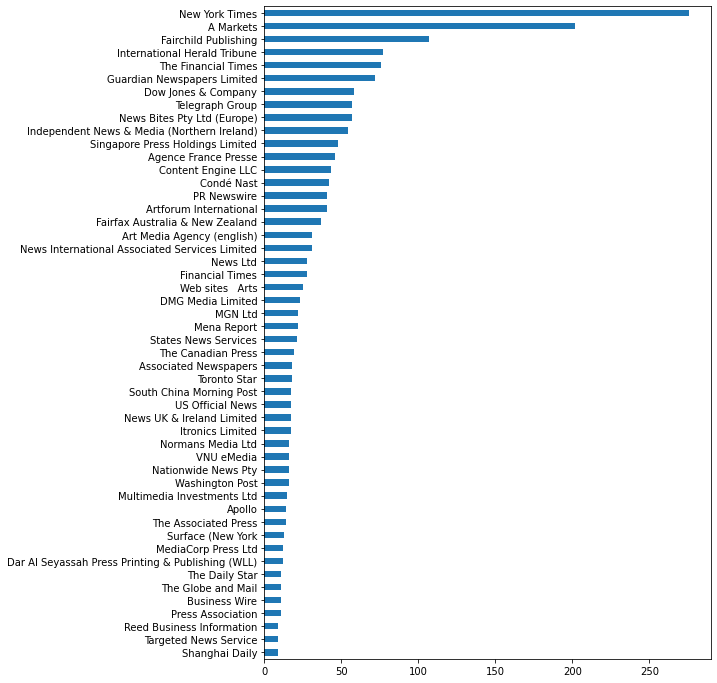

In [10]:
Journal = corpus_en['Journal'].value_counts().to_frame()
#Journal.to_csv('Journal_en.csv',index=1, header=True)
Journal.head(50).plot.barh(legend=None,figsize=(8,12)).invert_yaxis()
for i, v in enumerate(Journal.head(50)['Journal']):
    plt.text(v + 3, i + .25, str(v), color='black')

<AxesSubplot:ylabel='LenContent'>

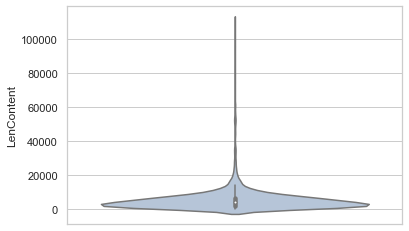

In [15]:
import seaborn as sns
sns.set(style="whitegrid")
#sns.violinplot(x='Year',y='LenContent', alpha=0.2, palette='Blues', data=data_description)
sns.set(style="whitegrid")
sns.color_palette("pastel")
sns.violinplot(y='LenContent', data=corpus_en, alpha=0.2, color='lightsteelblue')

In [16]:
cpendes = DataFrame(corpus_en['LenContent'].describe()).T.round(1)
cpendes

,count,mean,std,min,25%,50%,75%,max
LenContent,2639.0,5378.0,7180.9,9.0,1753.0,3839.0,6675.5,110464.0


In [14]:
corpusen = corpus_en['Content'].str.lower()

corpusen = corpusen.str.replace('palais de tokyo', 'palais_de_tokyo')
corpusen = corpusen.str.replace('new york', 'new_york')
corpusen = corpusen.str.replace('hong kong', 'hong_kong')
corpusen = corpusen.str.replace('los angeles', 'los_angeles')
corpusen = corpusen.str.replace('hip hop', 'hip_hop')
corpusen = corpusen.str.replace('art history', 'art_history')
corpusen = corpusen.str.replace('contemporary art', 'contemporaray_art')
corpusen = corpusen.str.replace('modern art', 'modern_art')
corpusen = corpusen.str.replace('venice biennale', 'venice_biennale')
corpusen = corpusen.str.replace('tate britain', 'tate_britain')
corpusen = corpusen.str.replace('pop culture', 'pop_culture')
corpusen = corpusen.str.replace('visual art', 'visual_art')
corpusen = corpusen.str.replace('new year', 'new_year')
corpusen = corpusen.str.replace('art work', 'art_work')
corpusen = corpusen.str.replace('new work', 'new_work')
corpusen = corpusen.str.replace('”', '')
corpusen = corpusen.str.replace('“', '')

corpusen = list(corpusen)
corpusen

["the idea of such a center--on the model of london's whitechapel art gallery, rotterdam's witte de with, or new_york's p.s. i--was developed by guy amsellem, head of the ministry's visual_arts department. while acknowledging that the stately palais_de_tokyo is perhaps not the ideal site for an alternative space, amsellem stresses the center's innovative aspects relative to existing public institutions in france--autonomous status, minimal staff and funding, and, above all, directors who are to be recruited from outside the usual arts-administration circuit and limited to three-year, nonrenewable tenures. one of the first responses to the announcement of the future center was a petition, signed by some 150 artists of greater and lesser renown, calling on trautmann to take the ministry's initiative to its logical conclusion and put an artist in charge of the new space. several months later, suzanne page, director of the mamvp, which has had its own showcase for contemporaray_art (l'arc)

In [11]:
import re
import string
from spacy.lang.fr.stop_words import STOP_WORDS as fr_stop
from spacy.lang.en.stop_words import STOP_WORDS as en_stop
from nltk.stem import WordNetLemmatizer

In [12]:
#from gensim.models import Phrases
#from gensim.models.phrases import Phrase

In [17]:

stopWords_enmore = ['like',"say",'said','mr','its','way','ive',"th","including",'iwas','p','im','isnt','—','s','say','think',
                    'm','ap','day','–','month','v','“i','sj','n','k','lc','httpenfashionheadlinecomimgsfeedljpg',
                    'wwwfondationbsorg','“','it’s','vm','that’s','“we','nw','',
                   'year','say','httpwwwbuysellsignalscombuysellsignalscombstmktstockresearchstockresearchdomarketnetherland']


stopWords = list(fr_stop) + list(en_stop) + stopWords_enmore 
exclude = set(string.punctuation)
lemma = WordNetLemmatizer()

def clean(corpusen):
    nonum_free = re.sub(r'\d+', '', corpusen)
    punc_free = "".join(p for p in nonum_free if p not in exclude)
    doublespace_free = re.sub('\s+', ' ', punc_free).strip()
    stop_free = " ".join([i for i in doublespace_free.split() if i not in stopWords])
    normalized = " ".join(lemma.lemmatize(word) for word in stop_free.split())

    return normalized

corpusen_clean = [clean(doc).split() for doc in corpusen]
corpusen_clean

[['idea',
  'centeron',
  'model',
  'london',
  'whitechapel',
  'art',
  'gallery',
  'rotterdam',
  'witte',
  'newyorks',
  'p',
  'developed',
  'guy',
  'amsellem',
  'head',
  'ministry',
  'visualarts',
  'department',
  'acknowledging',
  'stately',
  'palaisdetokyo',
  'ideal',
  'site',
  'alternative',
  'space',
  'amsellem',
  'stress',
  'center',
  'innovative',
  'aspect',
  'existing',
  'public',
  'institution',
  'franceautonomous',
  'status',
  'minimal',
  'staff',
  'funding',
  'director',
  'recruited',
  'outside',
  'usual',
  'artsadministration',
  'circuit',
  'limited',
  'threeyear',
  'nonrenewable',
  'tenure',
  'response',
  'announcement',
  'future',
  'center',
  'petition',
  'signed',
  'artist',
  'greater',
  'lesser',
  'renown',
  'calling',
  'trautmann',
  'ministry',
  'initiative',
  'logical',
  'conclusion',
  'artist',
  'charge',
  'new',
  'space',
  'month',
  'later',
  'suzanne',
  'page',
  'director',
  'mamvp',
  'showcase',

In [18]:
import gensim
from gensim import corpora
from gensim.corpora import Dictionary
from gensim.models import ldamodel
from gensim.models import CoherenceModel, LdaModel
from gensim import models

In [19]:
dictionary = corpora.Dictionary(corpusen_clean)
doc_term_matrix_en = [dictionary.doc2bow(doc) for doc in corpusen_clean]

In [352]:
#ldamodel_en = gensim.models.ldamodel.LdaModel(doc_term_matrix_en, num_topics=6, chunksize=150,
                                       #passes=10,id2word = dictionary, alpha='symmetric',per_word_topics=True)
#ldamodel_en = gensim.models.LdaMulticore(doc_term_matrix_en, num_topics=25, id2word = dictionary, alpha='symmetric',per_word_topics=True)

In [22]:
# Compute Coherence Score using c_v
coherence_model_lda_en = CoherenceModel(model=ldamodel_en, texts=corpusen_clean, dictionary=dictionary, coherence='c_v')
coherence_lda_en = coherence_model_lda_en.get_coherence()
print('\nCoherence Score: ', coherence_lda_en)


Coherence Score:  0.5127303347608291


In [348]:
#ldamodel_en.print_topics(num_words=40)

In [23]:
def get_lda_topics(model, num_topics):
    word_dict = {};
    for i in range(num_topics):
        words = model.show_topic(i, topn =50);
        word_dict['Topic # ' + str(int(i)+1)] = [i[0] for i in words];
    return pd.DataFrame(word_dict);

In [24]:
en_topic = get_lda_topics(ldamodel_en, 6)
en_topic.index = en_topic.index + 1
en_topic

,Topic # 1,Topic # 2,Topic # 3,Topic # 4,Topic # 5,Topic # 6
1,paris,art,rothschild,fashion,france,isbn
2,time,artist,edmond,collection,new,alk
3,people,work,loccitane,designer,director,pbk
4,say,exhibition,euro,model,time,hbk
5,city,museum,management,paris,french,bd
6,french,gallery,lbi,brand,art,musik
7,museum,new,international,dress,project,hrsg
8,life,newyork,nonexecutive,wear,company,foreword
9,thing,contemporarayart,price,season,year,ashgate
10,work,space,hkd,black,group,vt


In [25]:
en_topic.T

,1,2,3,4,5,6,7,8,9,10,...,41,42,43,44,45,46,47,48,49,50
Topic # 1,paris,time,people,say,city,french,museum,life,thing,work,...,inside,piece,great,film,france,lot,called,book,kind,view
Topic # 2,art,artist,work,exhibition,museum,gallery,new,newyork,contemporarayart,space,...,present,chicago,bmw,piece,image,public,american,music,biennale,event
Topic # 3,rothschild,edmond,loccitane,euro,management,lbi,international,nonexecutive,price,hkd,...,index,officer,traded,aexindex,trading,loss,levilion,edr,bernis,reinold
Topic # 4,fashion,collection,designer,model,paris,brand,dress,wear,season,black,...,skirt,rick,white,shirt,creative,trend,readytowear,haute,balenciaga,short
Topic # 5,france,new,director,time,french,art,project,company,year,group,...,number,change,today,award,brand,open,financial,space,industry,capital
Topic # 6,isbn,alk,pbk,hbk,bd,musik,hrsg,foreword,ashgate,vt,...,jahrhunderts,xix,pearson,distrb,musiktheater,musikwissenschaft,orawo,abcclio,kisumu,xxvii


In [507]:
en_topic.T.to_csv('en_topiclist.csv', index=1, header=True)

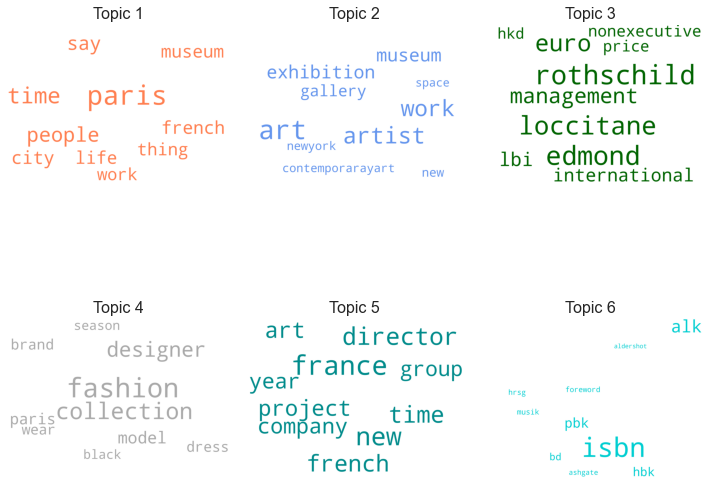

In [355]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors


cols = ['coral','cornflowerblue','darkgreen','darkgray','darkcyan','darkturquoise','blueviolet','mediumseagreen','darkkhaki',
        'brown','darkseagreen','blue','crimson','orchid','navy','limegreen','midnightblue','lightsalmon','gold','thistle']

cloud = WordCloud(stopwords=stopWords,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=50,
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = ldamodel_en.show_topics(formatted=False, num_topics=40)

fig, axes = plt.subplots(2, 3, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i+1), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [248]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model=gensim.models.ldamodel.LdaModel(doc_term_matrix_en, num_topics=num_topics, chunksize=150,
                                       passes=10, id2word = dictionary, alpha='symmetric',per_word_topics=True)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

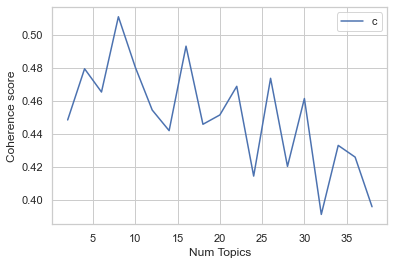

In [327]:
model_list, coherence_values = compute_coherence_values(dictionary=dictionary, 
                                                        corpus=doc_term_matrix_en, texts=corpusen_clean, 
                                                        start=2, limit=40, step=2)
# Show graph
import matplotlib.pyplot as plt
limit=40; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [362]:
import pyLDAvis
import warnings
try:
  import pyLDAvis.gensim
  CAN_VISUALIZE = True
  pyLDAvis.enable_notebook()
  from IPython.display import display
except ImportError:
    ValueError("SKIP: please install pyLDAvis")
    CAN_VISUALIZE = False
warnings.filterwarnings('ignore') 
%matplotlib inline

prepared = pyLDAvis.gensim.prepare(ldamodel_en, doc_term_matrix_en, dictionary)
pyLDAvis.display(prepared)

/Users/huxinmin/miniconda3/lib/python3.7/site-packages/sklearn/decomposition/_online_lda.py:29: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  EPS = np.finfo(np.float).eps


In [26]:
def format_topics_sentences(ldamodel=None, corpus=doc_term_matrix_en, texts=corpusen_clean):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=ldamodel_en, corpus=doc_term_matrix_en, texts=corpusen_clean)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.reset_index(drop=True)
df_dominant_topic.index = df_dominant_topic.index + 1
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
1,0,4.0,0.3784,"france, new, director, time, french, art, proj...","[idea, centeron, model, london, whitechapel, a..."
2,1,0.0,0.4706,"paris, time, people, say, city, french, museum...","[titled, home, home, exhibition, run, nov, jan..."
3,2,1.0,0.5253,"art, artist, work, exhibition, museum, gallery...","[artist, seven, country, asia, europe, investi..."
4,3,1.0,0.6440,"art, artist, work, exhibition, museum, gallery...","[minute, bard, spend, lifetime, reading, shake..."
5,4,1.0,0.3730,"art, artist, work, exhibition, museum, gallery...","[interested, ideological, purity, shortly, ope..."
...,...,...,...,...,...
2635,2634,0.0,0.6145,"paris, time, people, say, city, french, museum...","[italy, install, multimedia, work, sexhttpswww..."
2636,2635,4.0,0.7776,"france, new, director, time, french, art, proj...","[duty, provide, global, leadership, pascal, mo..."
2637,2636,0.0,0.6248,"paris, time, people, say, city, french, museum...","[ticket, completely, sold, week, july, visit, ..."
2638,2637,4.0,0.6849,"france, new, director, time, french, art, proj...","[fried, chicken, ingrédients, filet, volaille,..."


In [27]:
num_topics = 6
list_topic = []
for i in df_dominant_topic['Dominant_Topic']:
    if i == i:
        i = ('Topic # ' + str(int(i)+1))
    else:
        i = i
    list_topic.append(i)
df_dominant_topic['Dominant_Topic'] = list_topic
df_dominant_topic['Dominant_Topic']

1       Topic # 5
2       Topic # 1
3       Topic # 2
4       Topic # 2
5       Topic # 2
          ...    
2635    Topic # 1
2636    Topic # 5
2637    Topic # 1
2638    Topic # 5
2639    Topic # 1
Name: Dominant_Topic, Length: 2639, dtype: object

In [28]:
df_dominant_topic['Dominant_Topic']

1       Topic # 5
2       Topic # 1
3       Topic # 2
4       Topic # 2
5       Topic # 2
          ...    
2635    Topic # 1
2636    Topic # 5
2637    Topic # 1
2638    Topic # 5
2639    Topic # 1
Name: Dominant_Topic, Length: 2639, dtype: object

In [29]:
from natsort import natsorted
tp_count = df_dominant_topic["Dominant_Topic"].value_counts().to_frame()
tp_count = tp_count.reindex(natsorted(tp_count.index))
tp_count

,Dominant_Topic
Topic # 1,1218
Topic # 2,699
Topic # 3,53
Topic # 4,258
Topic # 5,409
Topic # 6,2


<AxesSubplot:>

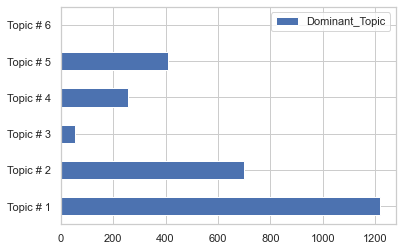

In [30]:
tp_count.plot.barh()

In [31]:
ldamodel_en.save('lda_en_6sujet.model')

In [32]:
ldamodel_en = LdaModel.load('lda_en_6sujet.model')

In [33]:
# Get topic weights and dominant topics ------------
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
import numpy as np
import matplotlib.colors as mcolors

# Get topic weights
topic_weights = []
for i, row_list in enumerate(ldamodel_en[doc_term_matrix_en]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 20
mycolors = np.array(cols)
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num],alpha=0.3)
show(plot)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2619 samples in 0.002s...
[t-SNE] Computed neighbors for 2619 samples in 0.051s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2619
[t-SNE] Computed conditional probabilities for sample 2000 / 2619
[t-SNE] Computed conditional probabilities for sample 2619 / 2619
[t-SNE] Mean sigma: 0.016163
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.904495
[t-SNE] KL divergence after 1000 iterations: 0.600911


Loading BokehJS ...

NameError: name 'cols' is not defined

In [34]:
#corpus_en['Year']=corpus_en['Date'].dt.year
#corpus_en.index = corpus_en.index + 1
corpus_en

/Users/huxinmin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Date,Journal,Author,Title,Content,Language,LenContent,Language2,Year
1,2000-01-01,NaN,MIRIAM ROSEN,Palais Coup(Brief Article),The idea of such a center--on the model of Lon...,en,1883,en,2000
2,2000-11-28,NaN,NaN,Quest for 'Home' in Globalized World,"Titled, My Home is Yours, Your Home is Mine, t...",en,6182,en,2000
3,2000-12-13,NaN,NaN,"Artist's Reflection on Personal, Interpersonal...",Twelve artists from seven countries in Asia an...,en,7765,en,2000
4,2001-01-05,NaN,NaN,Calendar Asia's Guide To Leisure & Arts Activi...,"You Give Us 97 Minutes, We'll Give You the Bar...",en,9836,en,2001
5,2001-01-06,International Herald Tribune,JONATHAN NAPACK CR INTERNATIONAL HERALD TRIBUNE,Biennials Shake Up Asian Scene,"I'm not interested in ideological purity, Sans...",en,2858,en,2001
...,...,...,...,...,...,...,...,...,...
2664,2021-06-02,New York Times,COCO ROMACK,Anne Imhof’s Unnerving Hall of Mirrors,While in Italy last year to install her multim...,en,16813,en,2021
2665,2021-06-04,Fairchild Publishing,MIMOSA SPENCER,Paris Fashion Week to Get New Tools to Improve...,"“We have a duty to provide global leadership,”...",en,3601,en,2021
2666,2021-06-05,Telegraph Group,SEB EMINA,Inside the $194m private art museum that cemen...,Tickets are completely sold out until the firs...,en,5556,en,2021
2667,2021-06-12,Web sites Economy Le Dauphine,NaN,Recette simple de chef lyonnais Mory Sacko po...,Fried chicken Ingrédients 4 filets de volaille...,en,183,en,2021


In [35]:
df_topic_descrip = pd.concat([corpus_en, df_dominant_topic], axis=1)
df_topic_descrip

,Date,Journal,Author,Title,Content,Language,LenContent,Language2,Year,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
1,2000-01-01,NaN,MIRIAM ROSEN,Palais Coup(Brief Article),The idea of such a center--on the model of Lon...,en,1883.0,en,2000.0,0.0,Topic # 5,0.3784,"france, new, director, time, french, art, proj...","[idea, centeron, model, london, whitechapel, a..."
2,2000-11-28,NaN,NaN,Quest for 'Home' in Globalized World,"Titled, My Home is Yours, Your Home is Mine, t...",en,6182.0,en,2000.0,1.0,Topic # 1,0.4706,"paris, time, people, say, city, french, museum...","[titled, home, home, exhibition, run, nov, jan..."
3,2000-12-13,NaN,NaN,"Artist's Reflection on Personal, Interpersonal...",Twelve artists from seven countries in Asia an...,en,7765.0,en,2000.0,2.0,Topic # 2,0.5253,"art, artist, work, exhibition, museum, gallery...","[artist, seven, country, asia, europe, investi..."
4,2001-01-05,NaN,NaN,Calendar Asia's Guide To Leisure & Arts Activi...,"You Give Us 97 Minutes, We'll Give You the Bar...",en,9836.0,en,2001.0,3.0,Topic # 2,0.6440,"art, artist, work, exhibition, museum, gallery...","[minute, bard, spend, lifetime, reading, shake..."
5,2001-01-06,International Herald Tribune,JONATHAN NAPACK CR INTERNATIONAL HERALD TRIBUNE,Biennials Shake Up Asian Scene,"I'm not interested in ideological purity, Sans...",en,2858.0,en,2001.0,4.0,Topic # 2,0.3730,"art, artist, work, exhibition, museum, gallery...","[interested, ideological, purity, shortly, ope..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2664,2021-06-02,New York Times,COCO ROMACK,Anne Imhof’s Unnerving Hall of Mirrors,While in Italy last year to install her multim...,en,16813.0,en,2021.0,NaN,NaN,NaN,NaN,NaN
2665,2021-06-04,Fairchild Publishing,MIMOSA SPENCER,Paris Fashion Week to Get New Tools to Improve...,"“We have a duty to provide global leadership,”...",en,3601.0,en,2021.0,NaN,NaN,NaN,NaN,NaN
2666,2021-06-05,Telegraph Group,SEB EMINA,Inside the $194m private art museum that cemen...,Tickets are completely sold out until the firs...,en,5556.0,en,2021.0,NaN,NaN,NaN,NaN,NaN
2667,2021-06-12,Web sites Economy Le Dauphine,NaN,Recette simple de chef lyonnais Mory Sacko po...,Fried chicken Ingrédients 4 filets de volaille...,en,183.0,en,2021.0,NaN,NaN,NaN,NaN,NaN


<AxesSubplot:xlabel='Year'>

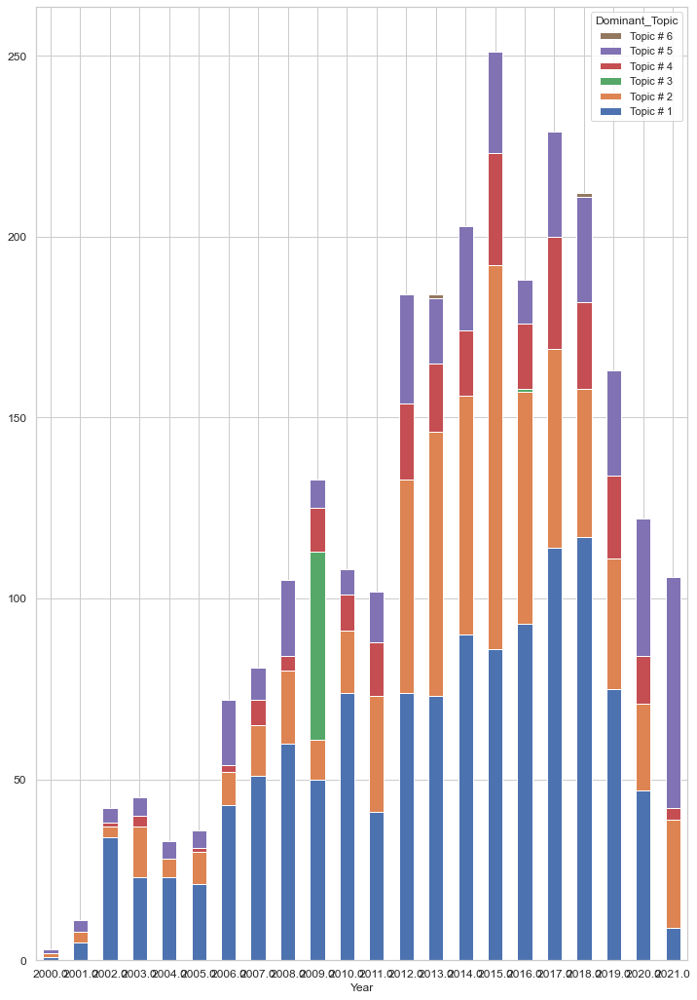

In [368]:
year_topic = df_topic_descrip[['Year', 'Dominant_Topic']]
(year_topic.groupby(['Year', 'Dominant_Topic']).size().unstack('Dominant_Topic')
 .plot.bar(stacked=True, figsize=(12,18), fontsize=12, rot=0, legend='reverse'))

In [36]:
df_topic_presseen = df_topic_descrip.set_index('Date')

In [37]:
df_pdt_en = df_topic_presseen.loc['2002-1':'2021-6']
pdt_en_sort = df_pdt_en.sort_index()
pdt_en_sort

/Users/huxinmin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  """Entry point for launching an IPython kernel.


,Journal,Author,Title,Content,Language,LenContent,Language2,Year,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
Date,,,,,,,,,,,,,
2002-01-06,New York Times,ALAN RIDING,ARTS ABROAD; Contemporary Art Moves Into a Par...,"PARIS, Feb. 5 - The question was asked through...",en,5718.0,en,2002.0,14.0,Topic # 1,0.5663,"paris, time, people, say, city, french, museum...","[paris, feb, question, asked, france, prominen..."
2002-01-15,Fairchild Publishing,ALISON BECKNER / BRID COSTELLO / NICOLE COTTRE...,PARIS SCENE THINGS TO DO AND SEE IN THE CITY ...,"Paris, is also one of its smallest, with only ...",en,8476.0,en,2002.0,15.0,Topic # 1,0.6923,"paris, time, people, say, city, french, museum...","[paris, smallest, seat, located, ile, cite, eu..."
2002-01-20,New York Times,HERBERT MUSCHAMP,"An American in Paris, Looking for Answers",A new venue for contemporary art has just open...,en,10790.0,en,2002.0,16.0,Topic # 1,0.7362,"paris, time, people, say, city, french, museum...","[new, venue, contemporarayart, opened, palaisd..."
2002-01-20,Telegraph Group,MARTIN GAYFORD,Review The Arts The city that art forgot Par...,"Of course, to many people - the general public...",en,8259.0,en,2002.0,17.0,Topic # 1,0.6542,"paris, time, people, say, city, french, museum...","[course, people, general, public, french, art,..."
2002-01-21,The Financial Times,MARK IRVING,THE ARTS Postcards from a bygone age of glory...,Paris has surrendered - not without a fight - ...,en,6907.0,en,2002.0,18.0,Topic # 1,0.5475,"paris, time, people, say, city, french, museum...","[paris, surrendered, fight, crown, newyork, po..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-02,New York Times,COCO ROMACK,Anne Imhof’s Unnerving Hall of Mirrors,While in Italy last year to install her multim...,en,16813.0,en,2021.0,NaN,NaN,NaN,NaN,NaN
2021-06-04,Fairchild Publishing,MIMOSA SPENCER,Paris Fashion Week to Get New Tools to Improve...,"“We have a duty to provide global leadership,”...",en,3601.0,en,2021.0,NaN,NaN,NaN,NaN,NaN
2021-06-05,Telegraph Group,SEB EMINA,Inside the $194m private art museum that cemen...,Tickets are completely sold out until the firs...,en,5556.0,en,2021.0,NaN,NaN,NaN,NaN,NaN


In [38]:
pdt_en_sort['TK']=pdt_en_sort['Dominant_Topic']+': '+pdt_en_sort['Keywords']
pdt_en_sort

,Journal,Author,Title,Content,Language,LenContent,Language2,Year,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text,TK
Date,,,,,,,,,,,,,,
2002-01-06,New York Times,ALAN RIDING,ARTS ABROAD; Contemporary Art Moves Into a Par...,"PARIS, Feb. 5 - The question was asked through...",en,5718.0,en,2002.0,14.0,Topic # 1,0.5663,"paris, time, people, say, city, french, museum...","[paris, feb, question, asked, france, prominen...","Topic # 1: paris, time, people, say, city, fre..."
2002-01-15,Fairchild Publishing,ALISON BECKNER / BRID COSTELLO / NICOLE COTTRE...,PARIS SCENE THINGS TO DO AND SEE IN THE CITY ...,"Paris, is also one of its smallest, with only ...",en,8476.0,en,2002.0,15.0,Topic # 1,0.6923,"paris, time, people, say, city, french, museum...","[paris, smallest, seat, located, ile, cite, eu...","Topic # 1: paris, time, people, say, city, fre..."
2002-01-20,New York Times,HERBERT MUSCHAMP,"An American in Paris, Looking for Answers",A new venue for contemporary art has just open...,en,10790.0,en,2002.0,16.0,Topic # 1,0.7362,"paris, time, people, say, city, french, museum...","[new, venue, contemporarayart, opened, palaisd...","Topic # 1: paris, time, people, say, city, fre..."
2002-01-20,Telegraph Group,MARTIN GAYFORD,Review The Arts The city that art forgot Par...,"Of course, to many people - the general public...",en,8259.0,en,2002.0,17.0,Topic # 1,0.6542,"paris, time, people, say, city, french, museum...","[course, people, general, public, french, art,...","Topic # 1: paris, time, people, say, city, fre..."
2002-01-21,The Financial Times,MARK IRVING,THE ARTS Postcards from a bygone age of glory...,Paris has surrendered - not without a fight - ...,en,6907.0,en,2002.0,18.0,Topic # 1,0.5475,"paris, time, people, say, city, french, museum...","[paris, surrendered, fight, crown, newyork, po...","Topic # 1: paris, time, people, say, city, fre..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-02,New York Times,COCO ROMACK,Anne Imhof’s Unnerving Hall of Mirrors,While in Italy last year to install her multim...,en,16813.0,en,2021.0,NaN,NaN,NaN,NaN,NaN,NaN
2021-06-04,Fairchild Publishing,MIMOSA SPENCER,Paris Fashion Week to Get New Tools to Improve...,"“We have a duty to provide global leadership,”...",en,3601.0,en,2021.0,NaN,NaN,NaN,NaN,NaN,NaN
2021-06-05,Telegraph Group,SEB EMINA,Inside the $194m private art museum that cemen...,Tickets are completely sold out until the firs...,en,5556.0,en,2021.0,NaN,NaN,NaN,NaN,NaN,NaN


In [411]:
pdt_en_sort.groupby(['Dominant_Topic']).resample('m').size()

Dominant_Topic  Date      
Topic # 1       2002-01-31    6
                2002-02-28    3
                2002-03-31    7
                2002-04-30    3
                2002-05-31    3
                             ..
Topic # 6       2018-01-31    0
                2018-02-28    0
                2018-03-31    0
                2018-04-30    0
                2018-05-31    1
Length: 1068, dtype: int64

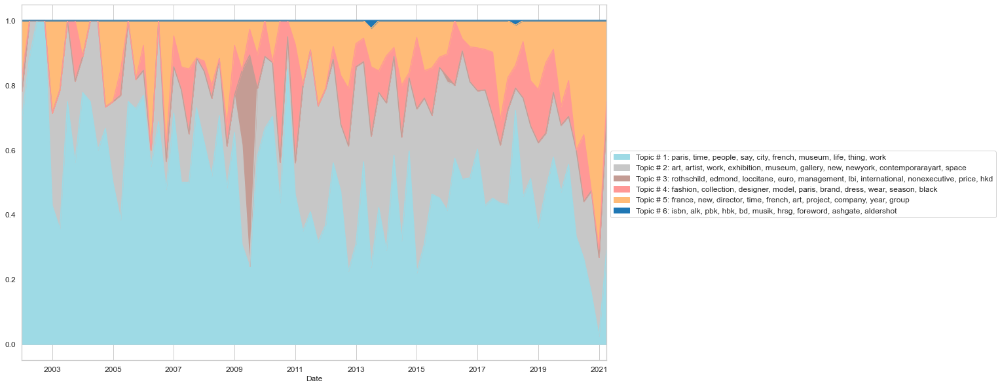

In [412]:
plot_df = pdt_en_sort.groupby(['TK']).resample('q').size().unstack('TK')
plot_df = plot_df.divide(plot_df.sum(axis=1),axis=0)
plot_df.plot.area(stacked=True, figsize=(16,10), fontsize=12, rot=0,colormap='tab20_r').legend(fontsize = 12,bbox_to_anchor=(1,.6))
#legend(fontsize = 15,ncol=2,bbox_to_anchor=(1,.7,0,.5))

<AxesSubplot:xlabel='Date'>

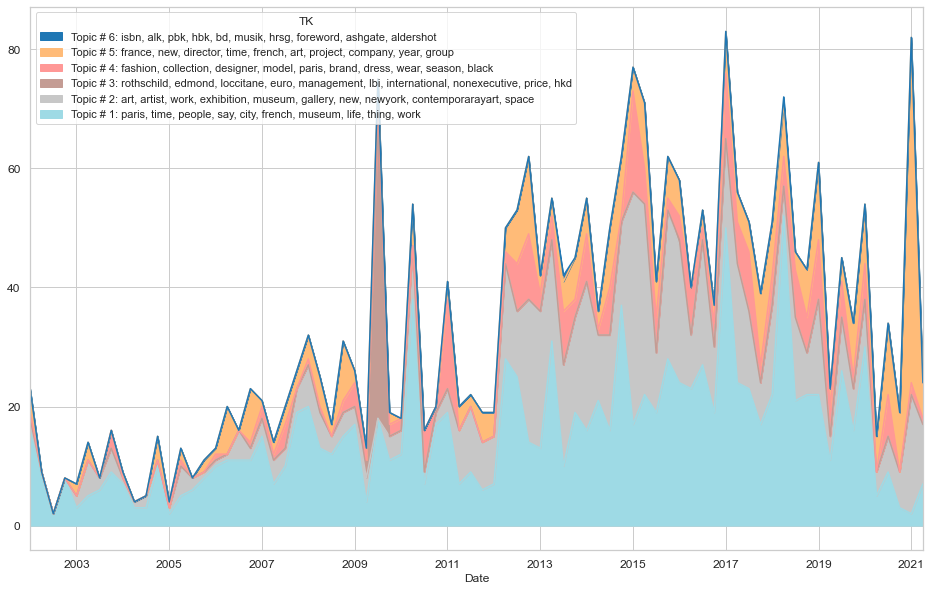

In [413]:
(pdt_en_sort.groupby(['TK']).resample('q').size().unstack('TK')
 .plot.area(stacked=True, figsize=(16,10), fontsize=12, rot=0,colormap ='tab20_r', legend='reverse'))

In [391]:
def top_objet(objet,pdt_en_sort,top_num):
    pd_new = pd.DataFrame()
    df_count = pdt_en_sort[objet].value_counts().to_frame()
    df_count = df_count[objet].head(top_num).reset_index()
    df_count.columns = [objet,'Numbers']
    for i in df_count[objet]:
        pd_new = pd_new.append(pdt_en_sort.loc[pdt_en_sort[objet]==i]) 
    return pd_new    

In [414]:

topic_top = top_objet('Journal',pdt_en_sort,50)
co_mat_Journal_topic = pd.crosstab(topic_top.Journal,topic_top.TK,
                                margins=True,margins_name="Total",normalize='index')
co_mat_Journal_topic

TK,"Topic # 1: paris, time, people, say, city, french, museum, life, thing, work","Topic # 2: art, artist, work, exhibition, museum, gallery, new, newyork, contemporarayart, space","Topic # 3: rothschild, edmond, loccitane, euro, management, lbi, international, nonexecutive, price, hkd","Topic # 4: fashion, collection, designer, model, paris, brand, dress, wear, season, black","Topic # 5: france, new, director, time, french, art, project, company, year, group","Topic # 6: isbn, alk, pbk, hbk, bd, musik, hrsg, foreword, ashgate, aldershot"
Journal,,,,,,
A Markets,0.396040,0.400990,0.000000,0.084158,0.118812,0.000000
Agence France Presse,0.434783,0.282609,0.021739,0.108696,0.152174,0.000000
Apollo,0.357143,0.500000,0.000000,0.142857,0.000000,0.000000
Art Media Agency (english),0.322581,0.387097,0.000000,0.129032,0.161290,0.000000
Artforum International,0.536585,0.292683,0.000000,0.073171,0.097561,0.000000
Associated Newspapers,0.500000,0.222222,0.000000,0.222222,0.055556,0.000000
Business Wire,0.545455,0.181818,0.000000,0.181818,0.090909,0.000000
Canwest News Service,0.444444,0.444444,0.000000,0.111111,0.000000,0.000000
Condé Nast,0.414634,0.317073,0.000000,0.073171,0.195122,0.000000


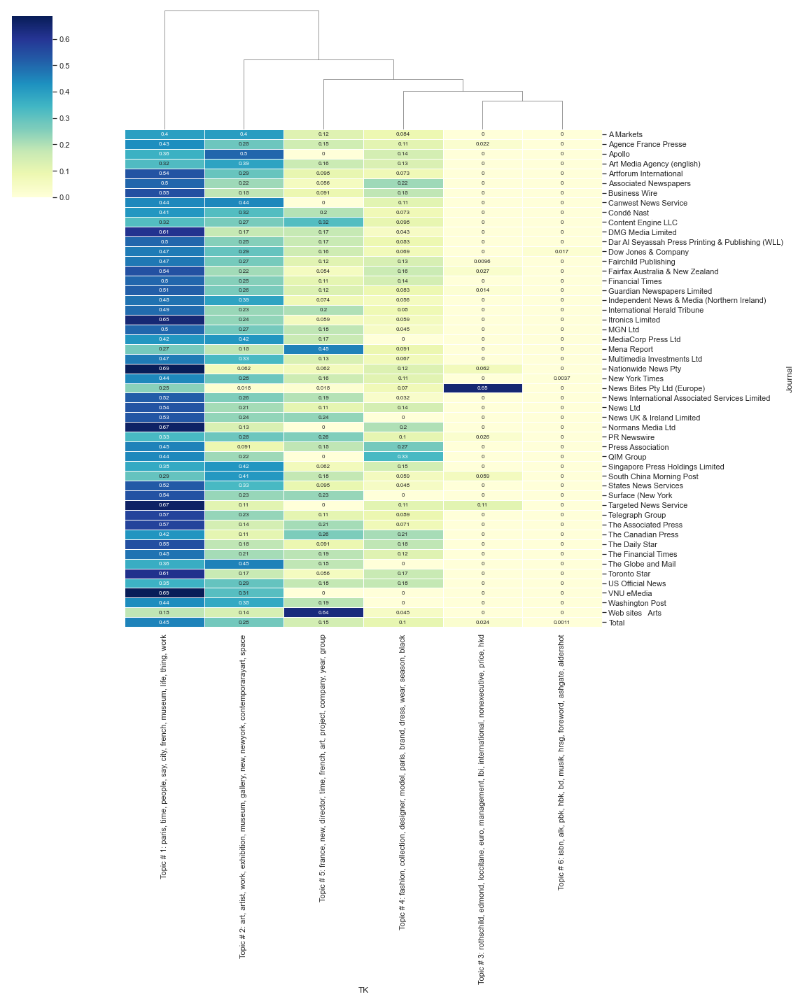

In [416]:
import matplotlib.pyplot as plt

sns.clustermap(co_mat_Journal_topic, figsize=(16,20),cmap="YlGnBu",linewidths=.5,
               method='centroid',row_cluster=False, annot=True,annot_kws={'size':8,'weight':'normal'})

In [417]:
y_top = top_objet('Journal',pdt_en_sort,10)
co_mat_year_topic = pd.crosstab(y_top.TK,y_top.Year,
                                margins=True,margins_name="Total",normalize='index')
co_mat_year_topic

Year,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0,2020.0,2021.0
TK,,,,,,,,,,,,,,,,,,,,
"Topic # 1: paris, time, people, say, city, french, museum, life, thing, work",0.019608,0.013072,0.008715,0.013072,0.019608,0.043573,0.037037,0.056645,0.065359,0.063181,0.098039,0.093682,0.098039,0.065359,0.080610,0.078431,0.063181,0.052288,0.030501,0.000000
"Topic # 2: art, artist, work, exhibition, museum, gallery, new, newyork, contemporarayart, space",0.006897,0.006897,0.010345,0.010345,0.003448,0.020690,0.020690,0.010345,0.027586,0.058621,0.100000,0.106897,0.106897,0.172414,0.103448,0.068966,0.065517,0.055172,0.041379,0.003448
"Topic # 3: rothschild, edmond, loccitane, euro, management, lbi, international, nonexecutive, price, hkd",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Topic # 4: fashion, collection, designer, model, paris, brand, dress, wear, season, black",0.010101,0.030303,0.000000,0.000000,0.000000,0.010101,0.010101,0.060606,0.040404,0.050505,0.111111,0.111111,0.090909,0.141414,0.080808,0.080808,0.050505,0.090909,0.030303,0.000000
"Topic # 5: france, new, director, time, french, art, project, company, year, group",0.014599,0.000000,0.007299,0.007299,0.021898,0.036496,0.043796,0.029197,0.043796,0.051095,0.145985,0.072993,0.087591,0.080292,0.043796,0.102190,0.058394,0.036496,0.065693,0.051095
"Topic # 6: isbn, alk, pbk, hbk, bd, musik, hrsg, foreword, ashgate, aldershot",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000
Total,0.013645,0.010721,0.007797,0.009747,0.012671,0.031189,0.029240,0.076023,0.046784,0.056530,0.102339,0.093567,0.094542,0.102339,0.078947,0.076023,0.060429,0.052632,0.037037,0.007797


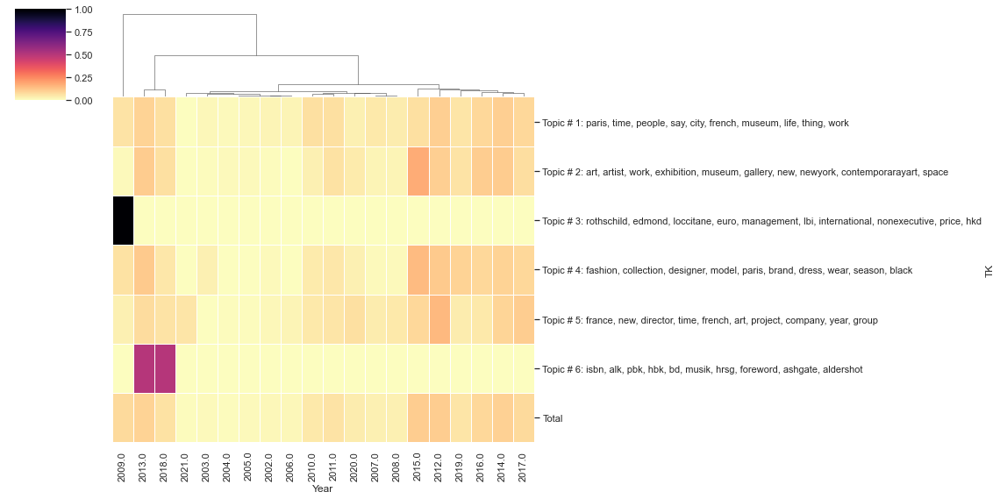

In [423]:
import matplotlib.pyplot as plt
#fig, ax = plt.subplots(figsize=(15,30))   
sns.clustermap(co_mat_year_topic, cmap="magma_r",figsize=(16, 8),linewidths=.5,
               method='centroid',row_cluster=False,)

In [39]:
topic_num = 100
lda_model=ldamodel_en
corpus=doc_term_matrix_en

topics_df1 = pd.DataFrame()
topics_df2 = pd.DataFrame()
topics_df3 = pd.DataFrame()

for i, row_list in enumerate(lda_model[corpus]):
    row = row_list[0] if lda_model.per_word_topics else row_list            
    row = sorted(row, key=lambda x: (x[1]), reverse=True)
    for j, (topic_num, prop_topic) in enumerate(row):
        if len(row) >= 3:        
            if j ==0:
                topics_df1 = topics_df1.append(pd.Series([int(topic_num), prop_topic]), ignore_index=True)
            elif j ==1:
                topics_df2 = topics_df2.append(pd.Series([int(topic_num), prop_topic]), ignore_index=True)
            elif j ==2:
                topics_df3 = topics_df3.append(pd.Series([int(topic_num), prop_topic]), ignore_index=True)
            else:
                break
        elif len(row) == 2:
            if j ==0:
                topics_df1 = topics_df1.append(pd.Series([int(topic_num), prop_topic]), ignore_index=True)
            elif j ==1:
                topics_df2 = topics_df2.append(pd.Series([int(topic_num), prop_topic]), ignore_index=True)
                topics_df3 = topics_df3.append(pd.Series(['-', '-']), ignore_index=True)
        elif len(row) == 1:
                topics_df1 = topics_df1.append(pd.Series([int(topic_num), prop_topic]), ignore_index=True)
                topics_df2 = topics_df2.append(pd.Series(['-', '-']), ignore_index=True)  
                topics_df3 = topics_df3.append(pd.Series(['-', '-']), ignore_index=True)        
                
            
topics_df1.rename(columns={0:'1st Topic', 1:'1st Topic Contribution'}, inplace=True)
topics_df2.rename(columns={0:'2nd Topic', 1:'2nd Topic Contribution'}, inplace=True)
topics_df3.rename(columns={0:'3rd Topic', 1:'3rd Topic Contribution'}, inplace=True)

topics_comb = pd.concat([topics_df1, topics_df2, topics_df3],  axis=1, sort=False)

#Join topics dataframe to original data

In [40]:
topics_comb

,1st Topic,1st Topic Contribution,2nd Topic,2nd Topic Contribution,3rd Topic,3rd Topic Contribution
0,4.0,0.378440,1.0,0.327759,0.0,0.289889
1,0.0,0.470645,1.0,0.449316,4.0,0.064814
2,1.0,0.525295,0.0,0.427316,4.0,0.046504
3,1.0,0.644016,0.0,0.310602,4.0,0.03497
4,1.0,0.373020,0.0,0.309026,4.0,0.30758
...,...,...,...,...,...,...
2634,0.0,0.614473,1.0,0.366751,4.0,0.018328
2635,4.0,0.777577,0.0,0.151992,3.0,0.068769
2636,0.0,0.624765,4.0,0.186869,1.0,0.157347
2637,4.0,0.684876,0.0,0.274903,1.0,0.010087


In [41]:
def change_labels(topics_comb):
    list_topic1 = []
    list_topic2 = []
    list_topic3 = []
    
    for i in topics_comb['1st Topic']:
        if i == i:
            i = ('Topic # ' + str(int(i)+1))
        else:
            i = i
        list_topic1.append(i)
    topics_comb['1st Topic'] = list_topic1
    
    for i in topics_comb['2nd Topic']:
        if i == '-':
            i = i
        elif i == i:
            i = ('Topic # ' + str(int(i)+1))
        else:
            i = i
        list_topic2.append(i)
    topics_comb['2nd Topic'] = list_topic2
    
    for i in topics_comb['3rd Topic']:
        if i == '-':
            i = i
        elif i == i:
            i = ('Topic # ' + str(int(i)+1))
        else:
            i = i
        list_topic3.append(i)
    topics_comb['3rd Topic'] = list_topic3
    topics_comb.index = topics_comb.index+1
    return topics_comb

In [42]:
co_occurence = change_labels(topics_comb)
co_occurence

,1st Topic,1st Topic Contribution,2nd Topic,2nd Topic Contribution,3rd Topic,3rd Topic Contribution
1,Topic # 5,0.378440,Topic # 2,0.327759,Topic # 1,0.289889
2,Topic # 1,0.470645,Topic # 2,0.449316,Topic # 5,0.064814
3,Topic # 2,0.525295,Topic # 1,0.427316,Topic # 5,0.046504
4,Topic # 2,0.644016,Topic # 1,0.310602,Topic # 5,0.03497
5,Topic # 2,0.373020,Topic # 1,0.309026,Topic # 5,0.30758
...,...,...,...,...,...,...
2635,Topic # 1,0.614473,Topic # 2,0.366751,Topic # 5,0.018328
2636,Topic # 5,0.777577,Topic # 1,0.151992,Topic # 4,0.068769
2637,Topic # 1,0.624765,Topic # 5,0.186869,Topic # 2,0.157347
2638,Topic # 5,0.684876,Topic # 1,0.274903,Topic # 2,0.010087


In [43]:
co_occurence.columns = ['First_Topic', 'First_Topic_Contribution','Second_Topic', 
                       'Second_Topic_Contribution','Third_Topic', 'Third_Topic_Contribution']
co_occurence

,First_Topic,First_Topic_Contribution,Second_Topic,Second_Topic_Contribution,Third_Topic,Third_Topic_Contribution
1,Topic # 5,0.378440,Topic # 2,0.327759,Topic # 1,0.289889
2,Topic # 1,0.470645,Topic # 2,0.449316,Topic # 5,0.064814
3,Topic # 2,0.525295,Topic # 1,0.427316,Topic # 5,0.046504
4,Topic # 2,0.644016,Topic # 1,0.310602,Topic # 5,0.03497
5,Topic # 2,0.373020,Topic # 1,0.309026,Topic # 5,0.30758
...,...,...,...,...,...,...
2635,Topic # 1,0.614473,Topic # 2,0.366751,Topic # 5,0.018328
2636,Topic # 5,0.777577,Topic # 1,0.151992,Topic # 4,0.068769
2637,Topic # 1,0.624765,Topic # 5,0.186869,Topic # 2,0.157347
2638,Topic # 5,0.684876,Topic # 1,0.274903,Topic # 2,0.010087


In [44]:
def top_topic(objet,data,top_num):
    pd_new = pd.DataFrame()
    df_count = data[objet].value_counts().to_frame()
    df_count = df_count[objet].head(top_num).reset_index()
    df_count.columns = [objet,'Numbers']
    for i in df_count[objet]:
        pd_new = pd_new.append(data.loc[data[objet]==i]) 
    return pd_new 


In [45]:
topic_top = top_topic('First_Topic',co_occurence,40)
co_mat_topic = pd.crosstab( topic_top.First_Topic, topic_top.Second_Topic,normalize='index')
co_mat_topic = co_mat_topic.drop(['-'],axis=1)
co_mat_topic

Second_Topic,Topic # 1,Topic # 2,Topic # 3,Topic # 4,Topic # 5,Topic # 6
First_Topic,,,,,,
Topic # 1,0.000000,0.431389,0.003287,0.215283,0.312243,0.000000
Topic # 2,0.559371,0.000000,0.000000,0.010014,0.402003,0.004292
Topic # 3,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
Topic # 4,0.888031,0.046332,0.000000,0.000000,0.065637,0.000000
Topic # 5,0.444988,0.400978,0.017115,0.100244,0.000000,0.004890
Topic # 6,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000


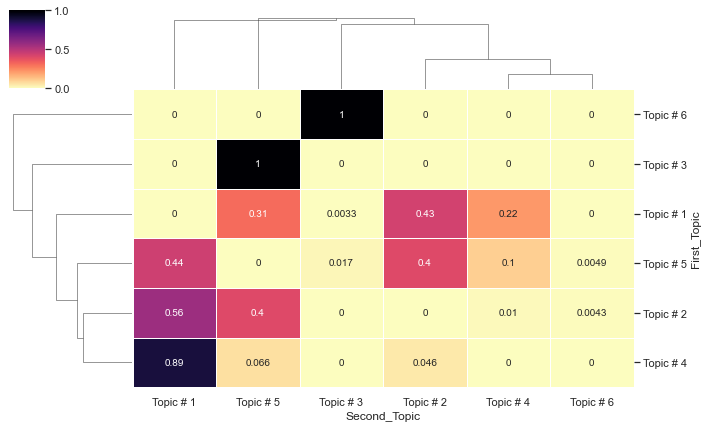

In [435]:
import matplotlib.pyplot as plt
#fig, ax = plt.subplots(figsize=(15,30))   
sns.clustermap(co_mat_topic, cmap="magma_r",figsize=(10, 6),linewidths=.5,
              method='centroid', annot=True,annot_kws={'size':10,'weight':'normal'})

In [2]:
from gensim.models import word2vec
from gensim.models import KeyedVectors

In [437]:
#sentences = list(word2vec.LineSentence("corpusfr.txt"))
model_w2v = word2vec.Word2Vec(corpusen_clean,min_count=5,size=200,workers=3,window=5, sg=1)
model_w2v.save('cpen_w2v.model')
print(model_w2v)

Word2Vec(vocab=21030, size=200, alpha=0.025)


In [3]:
model_w2v = KeyedVectors.load('cpen_w2v.model', mmap='r')
print(model_w2v)

Word2Vec(vocab=21030, size=200, alpha=0.025)


In [4]:
ms = model_w2v.most_similar('contemporaryart', topn=100)
ms

/Users/huxinmin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('squaremeter', 0.9044694900512695),
 ('sq', 0.9026099443435669),
 ('reopens', 0.8989405035972595),
 ('occupy', 0.8817051649093628),
 ('groundfloor', 0.8749433755874634),
 ('arario', 0.8716632723808289),
 ('beacon', 0.8706757426261902),
 ('pantin', 0.8678833246231079),
 ('barrack', 0.8676141500473022),
 ('carreau', 0.8668258786201477),
 ('newyork’s', 0.8621038198471069),
 ('bund', 0.8604710102081299),
 ('neighboring', 0.8583394289016724),
 ('tripled', 0.8578934073448181),
 ('gallery’s', 0.8577839732170105),
 ('reconfigured', 0.8574504852294922),
 ('renovating', 0.8567469120025635),
 ('gillman', 0.855095624923706),
 ('remodeled', 0.854611337184906),
 ('renting', 0.8539968729019165),
 ('salzburg', 0.8530105948448181),
 ('inaugurated', 0.8523913025856018),
 ('neighbouring', 0.852290153503418),
 ('jameel', 0.8518262505531311),
 ('mezzanine', 0.8502432703971863),
 ('whitewalled', 0.8496662378311157),
 ('marrakesh', 0.8493287563323975),
 ('capital’s', 0.8488155603408813),
 ('hoxton', 0.8480

In [489]:
wls_art = ['contemporaryart','museum','palaisdetokyo','creation','dealer','institution','pompidou','businessman',
           'politics','exhibition','collector','gallery','biennale','foundation','festival','moma','guggenheim',
           'modernart','market','young','video','performance','artist','curator','film','music','runway','auction',
          'dance','installation','cinema','fashion','luxury','buyer','bar','restaurant','sale','sothebys','christie’s']

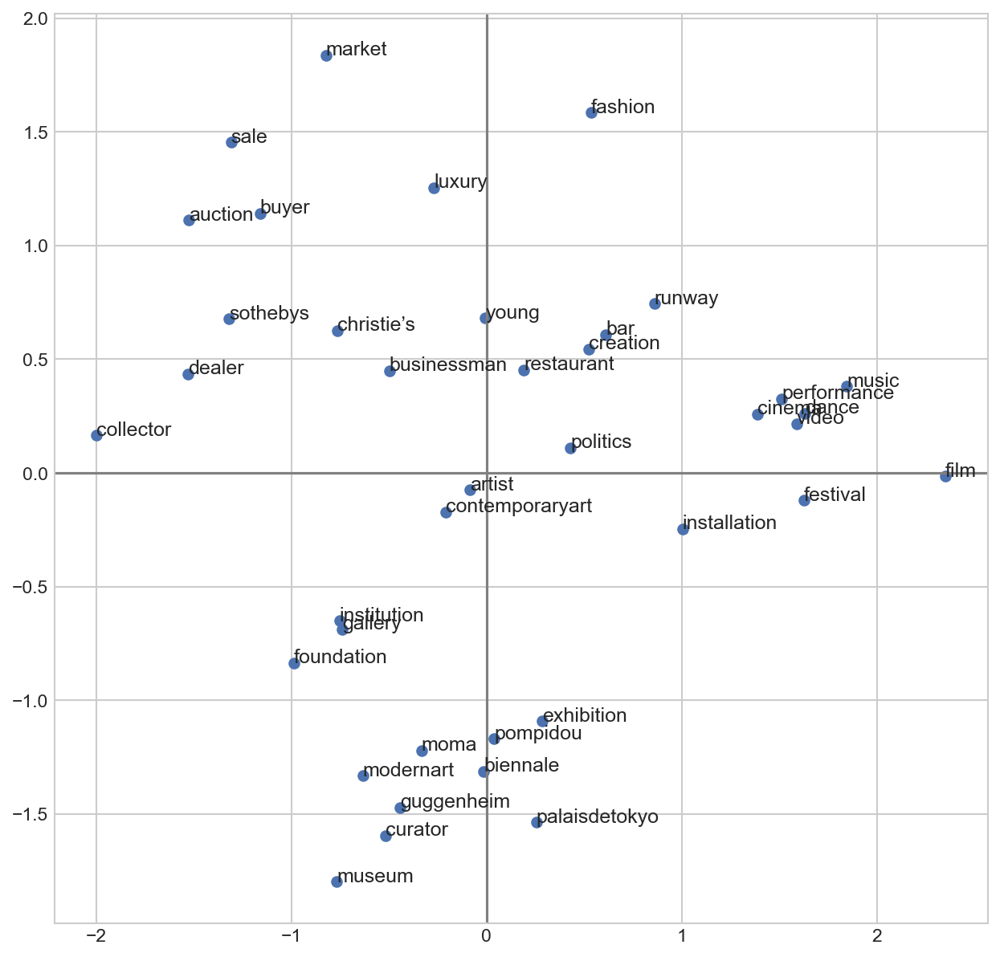

In [513]:
# -*- coding: utf-8 -*-
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
from matplotlib import pyplot

#Using corpus training model
model = model_w2v

# Based on 2d PCA fitting data
X = model[wls_art]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# Visual display
fig = plt.figure(figsize=(10, 10),dpi=150)
plt.style.use('seaborn-whitegrid')
pyplot.scatter(result[:, 0], result[:, 1])
words = wls_art
for i, word in enumerate(words):
    pyplot.annotate(word, xy=(result[i, 0], result[i, 1]),fontsize=12,rotation=0)
plt.axhline(0, color='grey')
plt.axvline(0, color='grey')

pyplot.show()
